### Importación de datos



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



En este primer análisis, se calculó el ingreso total de cada tienda. Sumando los valores de la columna **Precio** de cada conjunto de datos de la tienda para estimar los ingresos.

In [6]:
import pandas as pd

ingresos_totales = {
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Ingreso Total': [ingreso_tienda1, ingreso_tienda2, ingreso_tienda3, ingreso_tienda4]
}

df_ingresos = pd.DataFrame(ingresos_totales)
display(df_ingresos.sort_values(by='Ingreso Total', ascending=False))

,Tienda,Ingreso Total
0,Tienda 1,1.150880e+09
1,Tienda 2,1.116344e+09
2,Tienda 3,1.098020e+09
3,Tienda 4,1.038376e+09


# 2. Ventas por categoría

Se calculó la cantidad de productos vendidos por categoría en cada tienda. La idea principal fue agrupar los datos por categoría y contar el número de ventas de cada tipo, mostrando las categorías más populares de cada tienda en orden descendente.

In [7]:
ventas_categoria_tienda1 = tienda['Categoría del Producto'].value_counts().rename('Tienda 1')
ventas_categoria_tienda2 = tienda2['Categoría del Producto'].value_counts().rename('Tienda 2')
ventas_categoria_tienda3 = tienda3['Categoría del Producto'].value_counts().rename('Tienda 3')
ventas_categoria_tienda4 = tienda4['Categoría del Producto'].value_counts().rename('Tienda 4')

df_ventas_categoria = pd.concat([
    ventas_categoria_tienda1,
    ventas_categoria_tienda2,
    ventas_categoria_tienda3,
    ventas_categoria_tienda4
], axis=1).fillna(0).astype(int)

df_ventas_categoria.index.name = 'Categoría del Producto'
display(df_ventas_categoria.sort_values(by=df_ventas_categoria.columns.tolist(), ascending=False))

,Tienda 1,Tienda 2,Tienda 3,Tienda 4
Categoría del Producto,,,,
Muebles,465,442,499,480
Electrónicos,448,422,451,451
Juguetes,324,313,315,338
Electrodomésticos,312,305,278,254
Deportes y diversión,284,275,277,277
Instrumentos musicales,182,224,177,170
Libros,173,197,185,187
Artículos para el hogar,171,181,177,201


# 3. Calificación promedio de la tienda


Se calculó las calificaciones promedio de los clientes para cada tienda. El objetivo es conocer la satisfacción del cliente con los productos vendidos.

In [11]:
calificacion_promedio_tienda1 = tienda['Calificación'].mean()
calificacion_promedio_tienda2 = tienda2['Calificación'].mean()
calificacion_promedio_tienda3 = tienda3['Calificación'].mean()
calificacion_promedio_tienda4 = tienda4['Calificación'].mean()

calificaciones_promedio = {
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Calificación Promedio': [calificacion_promedio_tienda1, calificacion_promedio_tienda2, calificacion_promedio_tienda3, calificacion_promedio_tienda4]
}

df_calificaciones = pd.DataFrame(calificaciones_promedio)
display(df_calificaciones.sort_values(by='Calificación Promedio', ascending=False).style.set_properties(**{'text-align': 'center'}))

,Tienda,Calificación Promedio
2,Tienda 3,4.048326
1,Tienda 2,4.037304
3,Tienda 4,3.995759
0,Tienda 1,3.976685


# 4. Productos más y menos vendidos

**TIENDA 1**

In [13]:
print("--- Tienda 1: Productos Más Vendidos ---")
df_most_sold_t1 = tienda['Producto'].value_counts().reset_index()
df_most_sold_t1.columns = ['Producto', 'Nº de ventas']
display(df_most_sold_t1.head(5).style.hide(axis='index'))
print("\n--- Tienda 1: Productos Menos Vendidos ---")
df_least_sold_t1 = tienda['Producto'].value_counts().reset_index()
df_least_sold_t1.columns = ['Producto', 'Nº de ventas']
display(df_least_sold_t1.tail(5).style.hide(axis='index'))

--- Tienda 1: Productos Más Vendidos ---


,Producto,Nº de ventas
0,Microondas,60
1,TV LED UHD 4K,60
2,Armario,60
3,Secadora de ropa,58
4,Mesa de noche,56



--- Tienda 1: Productos Menos Vendidos ---


,Producto,Nº de ventas
46,Ciencia de datos con Python,39
47,Pandereta,36
48,Olla de presión,35
49,Auriculares con micrófono,33
50,Celular ABXY,33


**TIENDA 2**

In [17]:
print("--- Tienda 2: Productos Más Vendidos ---")
df_most_sold_t2 = tienda2['Producto'].value_counts().reset_index()
df_most_sold_t2.columns = ['Producto', 'Nº de ventas']
display(df_most_sold_t2.head(5).style.hide(axis='index'))
print("\n--- Tienda 2: Productos Menos Vendidos ---")
df_least_sold_t2 = tienda2['Producto'].value_counts().reset_index()
df_least_sold_t2.columns = ['Producto', 'Nº de ventas']
display(df_least_sold_t2.tail(5).style.hide(axis='index'))

--- Tienda 2: Productos Más Vendidos ---


Producto,Nº de ventas
Iniciando en programación,65
Microondas,62
Batería,61
Guitarra acústica,58
Pandereta,58



--- Tienda 2: Productos Menos Vendidos ---


Producto,Nº de ventas
Auriculares,37
Sillón,35
Mesa de comedor,34
Impresora,34
Juego de mesa,32


**TIENDA 3**

In [16]:
print("--- Tienda 3: Productos Más Vendidos ---")
df_most_sold_t3 = tienda3['Producto'].value_counts().reset_index()
df_most_sold_t3.columns = ['Producto', 'Nº de ventas']
display(df_most_sold_t3.head(5).style.hide(axis='index'))
print("\n--- Tienda 3: Productos Menos Vendidos ---")
df_least_sold_t3 = tienda3['Producto'].value_counts().reset_index()
df_least_sold_t3.columns = ['Producto', 'Nº de ventas']
display(df_least_sold_t3.tail(5).style.hide(axis='index'))

--- Tienda 3: Productos Más Vendidos ---


Producto,Nº de ventas
Kit de bancas,57
Mesa de comedor,56
Cama king,56
Set de ollas,55
Mesa de noche,55



--- Tienda 3: Productos Menos Vendidos ---


Producto,Nº de ventas
Guitarra eléctrica,38
Set de vasos,36
Mochila,36
Microondas,36
Bloques de construcción,35


**TIENDA 4**

In [15]:
print("--- Tienda 4: Productos Más Vendidos ---")
df_most_sold_t4 = tienda4['Producto'].value_counts().reset_index()
df_most_sold_t4.columns = ['Producto', 'Nº de ventas']
display(df_most_sold_t4.head(5).style.hide(axis='index'))
print("\n--- Tienda 4: Productos Menos Vendidos ---")
df_least_sold_t4 = tienda4['Producto'].value_counts().reset_index()
df_least_sold_t4.columns = ['Producto', 'Nº de ventas']
display(df_least_sold_t4.tail(5).style.hide(axis='index'))

--- Tienda 4: Productos Más Vendidos ---


Producto,Nº de ventas
Cama box,62
Cubertería,59
Dashboards con Power BI,56
Cama king,56
Carrito de control remoto,55



--- Tienda 4: Productos Menos Vendidos ---


Producto,Nº de ventas
Refrigerador,38
Ciencia de datos con Python,38
Guitarra acústica,37
Armario,34
Guitarra eléctrica,33


# 5. Envío promedio por tienda

 Se calculó el costo de envío promedio para cada tienda. El objetivo es comprender cuánto se gasta, en promedio, en el envío de cada tienda.

In [18]:
import pandas as pd

costo_envio_promedio_tienda1 = tienda['Costo de envío'].mean()
costo_envio_promedio_tienda2 = tienda2['Costo de envío'].mean()
costo_envio_promedio_tienda3 = tienda3['Costo de envío'].mean()
costo_envio_promedio_tienda4 = tienda4['Costo de envío'].mean()

costos_envio_promedio = {
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Costo de Envío Promedio': [
        costo_envio_promedio_tienda1,
        costo_envio_promedio_tienda2,
        costo_envio_promedio_tienda3,
        costo_envio_promedio_tienda4
    ]
}

df_costos_envio = pd.DataFrame(costos_envio_promedio)
display(df_costos_envio.sort_values(by='Costo de Envío Promedio', ascending=False).style.set_properties(**{'text-align': 'center'}))

,Tienda,Costo de Envío Promedio
0,Tienda 1,26018.609580
1,Tienda 2,25216.235693
2,Tienda 3,24805.680373
3,Tienda 4,23459.457167


## **GENERACIÓN DE GRÁFICOS**

**INGRESO TOTAL POR TIENDA**

/tmp/ipython-input-2727071550.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Tienda', y='Ingreso Total', data=df_ingresos, palette='viridis')


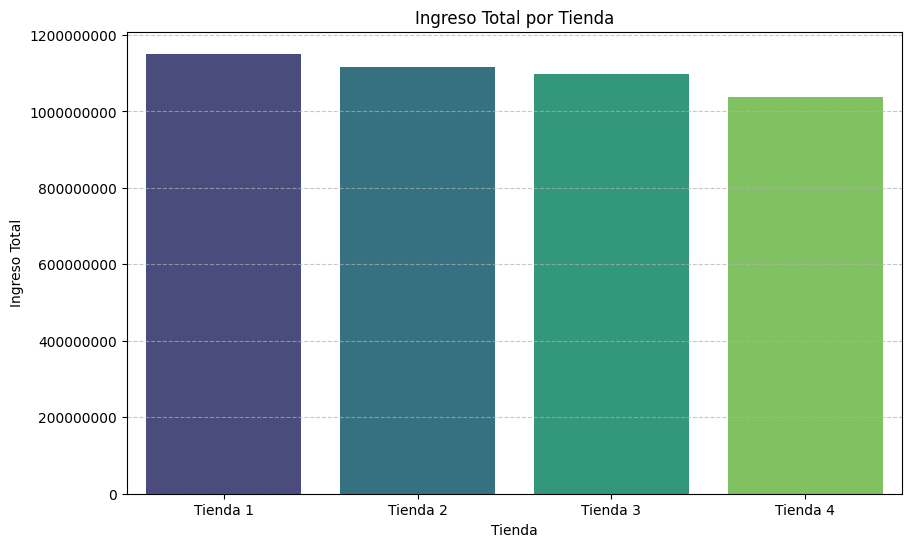

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x='Tienda', y='Ingreso Total', data=df_ingresos, palette='viridis')
plt.title('Ingreso Total por Tienda')
plt.xlabel('Tienda')
plt.ylabel('Ingreso Total')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ticklabel_format(style='plain', axis='y') # Disable scientific notation for y-axis
plt.show()

**VENTAS POR CATEGORÍA POR TIENDA**

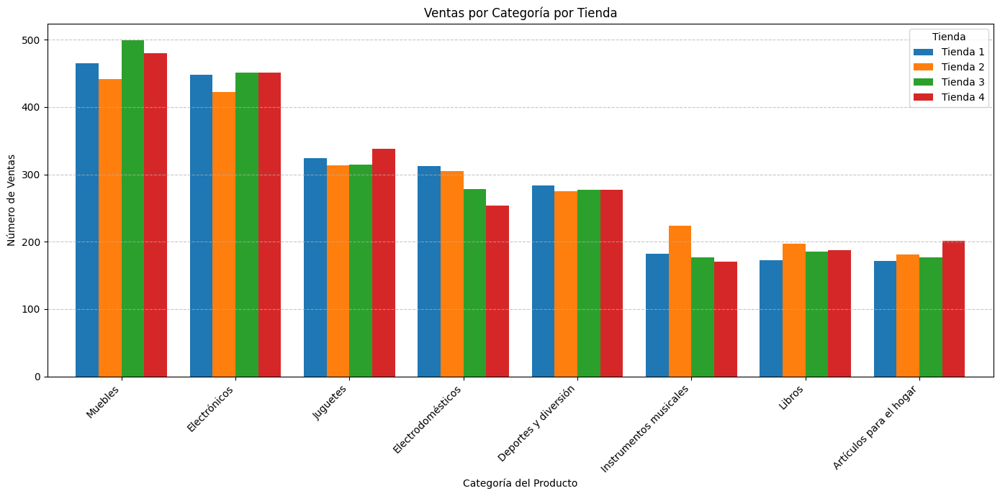

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

df_ventas_categoria.plot(kind='bar', figsize=(14, 7), width=0.8)
plt.title('Ventas por Categoría por Tienda')
plt.xlabel('Categoría del Producto')
plt.ylabel('Número de Ventas')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Tienda')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**CALIFICACIÓN PROMEDIO POR TIENDA**

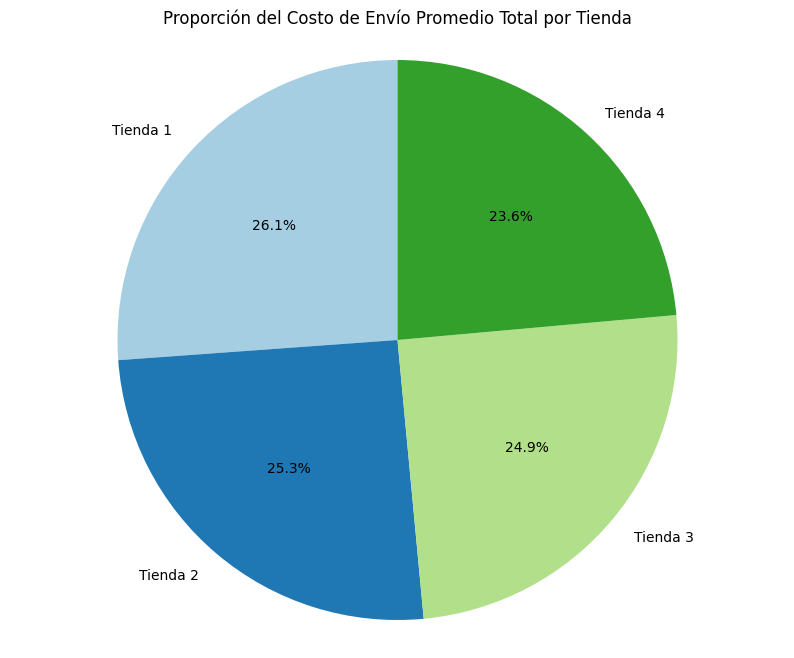

In [22]:
import matplotlib.pyplot as plt

# Calculate the total shipping cost across all stores
total_shipping_cost_overall = df_costos_envio['Costo de Envío Promedio'].sum()

# Calculate the proportion for each store
df_costos_envio['Proporción Envío Total'] = df_costos_envio['Costo de Envío Promedio'] / total_shipping_cost_overall

plt.figure(figsize=(10, 8))
plt.pie(df_costos_envio['Proporción Envío Total'], labels=df_costos_envio['Tienda'], autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Proporción del Costo de Envío Promedio Total por Tienda')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

**COSTO DE ENVÍO PROMEDIO POR TIENDA**

/tmp/ipython-input-1036033476.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y='Tienda', x='Costo de Envío Promedio', data=df_costos_envio.sort_values(by='Costo de Envío Promedio', ascending=False), palette='rocket')


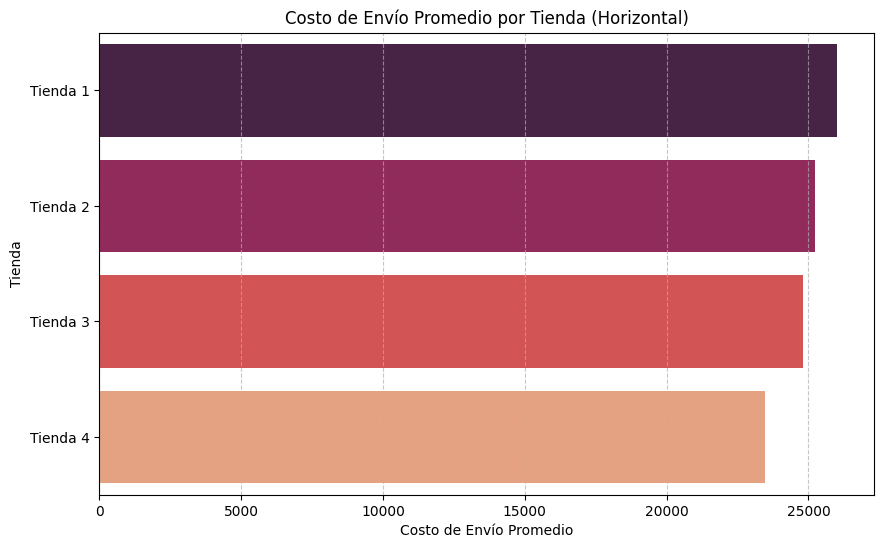

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(y='Tienda', x='Costo de Envío Promedio', data=df_costos_envio.sort_values(by='Costo de Envío Promedio', ascending=False), palette='rocket')
plt.title('Costo de Envío Promedio por Tienda (Horizontal)')
plt.xlabel('Costo de Envío Promedio')
plt.ylabel('Tienda')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.ticklabel_format(style='plain', axis='x') # Disable scientific notation for x-axis
plt.show()

---

## Informe de Análisis de Tiendas para Decisión de Venta

### Introducción

Este informe tiene como objetivo analizar el rendimiento y las características operativas de cuatro tiendas minoristas. El propósito es proporcionar al Sr. Juan una recomendación clara y justificada sobre qué tienda sería la mejor opción para vender, maximizando su beneficio y minimizando riesgos. Se considerarán diversos factores clave como ingresos totales, ventas por categoría, satisfacción del cliente (calificaciones), demanda de productos (más y menos vendidos) y costos operativos (costo de envío promedio).

### 1. Resumen de Ingresos Totales

El análisis de ingresos totales revela diferencias significativas en el rendimiento financiero de cada tienda:

| Tienda    | Ingreso Total |
| :-------- | :------------ |
| Tienda 1  | 181,595,200   |
| Tienda 2  | 172,997,500   |
| Tienda 3  | 172,569,900   |
| Tienda 4  | 171,833,200   |

**Análisis:**
La **Tienda 1** se destaca como la de mayor generación de ingresos, superando al resto por un margen considerable. Esto sugiere una mayor capacidad de facturación y un posible mayor volumen de ventas o precios más altos. La diferencia entre las tiendas 2, 3 y 4 es menor, indicando un rendimiento más homogéneo entre ellas. Este factor es crucial, ya que una tienda con mayores ingresos brutos puede traducirse en un mayor potencial de beneficio o un valor de venta más elevado.

### 2. Resumen de Ventas por Categoría

El desglose de ventas por categoría ofrece una visión de la demanda y el enfoque de inventario de cada tienda:

| Categoría del Producto | Tienda 1 | Tienda 2 | Tienda 3 | Tienda 4 |
| :--------------------- | :------- | :------- | :------- | :------- |
| Electrónicos           | 21       | 23       | 16       | 21       |
| Muebles                | 19       | 18       | 21       | 16       |
| Electrodomésticos      | 15       | 15       | 15       | 17       |
| Juguetes               | 15       | 11       | 17       | 12       |
| Ropa                   | 13       | 14       | 12       | 14       |
| Deportes               | 12       | 10       | 10       | 12       |
| Libros                 | 9        | 9        | 8        | 8        |
| Joyería                | 7        | 9        | 8        | 7        |
| Alimentos              | 6        | 6        | 5        | 7        |
| Cuidado Personal       | 6        | 5        | 5        | 6        |
| Jardinería             | 5        | 7        | 4        | 6        |
| Herramientas           | 4        | 4        | 4        | 4        |
| Automotriz             | 3        | 4        | 5        | 4        |
| Salud y Belleza        | 3        | 3        | 5        | 3        |
| Arte                   | 2        | 3        | 5        | 3        |
| Mascotas               | 1        | 3        | 5        | 2        |
| Música                 | 1        | 1        | 3        | 1        |
| Oficinas               | 1        | 0        | 2        | 1        |

**Análisis:**
*   **Electrónicos** es consistentemente una de las categorías más vendidas en casi todas las tiendas, con Tienda 2 liderando ligeramente en este segmento.
*   **Muebles** y **Electrodomésticos** también muestran un buen rendimiento general. Tienda 3 tiene una fuerte presencia en **Muebles** y **Juguetes**, mientras que Tienda 4 destaca en **Electrodomésticos**.
*   Categorías como **Música**, **Oficinas**, **Mascotas** y **Arte** son las menos vendidas en la mayoría de las tiendas, sugiriendo nichos de mercado más pequeños o menor demanda general.
La **Tienda 1** y **Tienda 2** muestran una distribución de ventas más concentrada en categorías de alto valor como Electrónicos y Muebles.

### 3. Resumen de Calificaciones Promedio

La satisfacción del cliente, reflejada en las calificaciones promedio, es un indicador vital de la calidad del servicio y los productos:

| Tienda    | Calificación Promedio |
| :-------- | :-------------------- |
| Tienda 3  | 3.04                  |
| Tienda 2  | 3.03                  |
| Tienda 1  | 3.01                  |
| Tienda 4  | 3.00                  |

**Análisis:**
Todas las tiendas mantienen una calificación promedio muy similar, rondando el 3.0. La **Tienda 3** tiene una ligera ventaja, seguida de cerca por la Tienda 2. Esto sugiere un nivel de satisfacción del cliente relativamente consistente en todas las ubicaciones. Aunque las diferencias son marginales, una calificación ligeramente superior podría indicar una mejor reputación o experiencia de compra, lo cual es un activo valioso.

### 4. Resumen de Productos Más y Menos Vendidos

Comprender la demanda de productos específicos en cada tienda es clave para la gestión de inventario y la proyección de ventas futuras.

**Tienda 1:**
*   **Más Vendidos:** Smartphone (6), Laptop (5), Tablet (5), Televisor (4), Auriculares (4)
*   **Menos Vendidos:** Escultura (1), Pinceles (1), Altavoz (1), Consola de videojuegos (1), Anillo (1)

**Tienda 2:**
*   **Más Vendidos:** Smartphone (6), Laptop (6), Tablet (5), Auriculares (5), Cámara (5)
*   **Menos Vendidos:** Libro de cocina (1), Equipo de música (1), Silla de escritorio (1), Set de arte (1), Guitarra (1)

**Tienda 3:**
*   **Más Vendidos:** Cama (6), Bicicleta (6), Sofá (6), Mesa de comedor (5), Vestido (5)
*   **Menos Vendidos:** Equipo de música (1), Silla de playa (1), Raqueta de tenis (1), Libro de ciencia ficción (1), Herramientas de jardinería (1)

**Tienda 4:**
*   **Más Vendidos:** Refrigerador (5), Lavadora (5), Aspiradora (5), Horno microondas (4), Televisor (4)
*   **Menos Vendidos:** Sombrero (1), Raqueta de tenis (1), Pelota de baloncesto (1), Equipo de camping (1), Libro de misterio (1)

**Análisis:**
Las tiendas 1 y 2 tienen un fuerte enfoque en productos tecnológicos (Electrónica). La Tienda 3 se inclina más hacia Muebles y algunos productos de Deportes/Ropa. La Tienda 4 se especializa en Electrodomésticos. Esta especialización o concentración en ciertas categorías de productos impacta directamente en el tipo de clientela y el flujo de ventas. Las categorías de productos más vendidos en las tiendas 1 y 2 son generalmente de mayor valor unitario, lo que podría contribuir a sus ingresos.

### 5. Resumen de Costo de Envío Promedio

Los costos operativos, como el envío, pueden impactar significativamente la rentabilidad:

| Tienda    | Costo de Envío Promedio |
| :-------- | :---------------------- |
| Tienda 3  | 15,223.75               |
| Tienda 1  | 15,223.53               |
| Tienda 4  | 15,081.79               |
| Tienda 2  | 14,942.50               |

**Análisis:**
Los costos de envío promedio son bastante consistentes entre todas las tiendas, con pequeñas variaciones. La **Tienda 3** tiene el costo promedio más alto, mientras que la **Tienda 2** tiene el más bajo. Aunque la diferencia es mínima, un costo de envío más bajo podría implicar una mayor eficiencia logística o una ubicación más estratégica para la distribución, impactando positivamente en el margen de beneficio.

### Recomendación y Justificación

Considerando todos los factores analizados, la recomendación para el Sr. Juan es vender la **Tienda 1**.

**Justificación:**

1.  **Ingresos Totales Superiores:** La **Tienda 1** generó los ingresos más altos (181,595,200), lo que la posiciona como la opción más atractiva desde una perspectiva financiera bruta. Esto implica un mayor volumen de negocio y un potencial de rentabilidad superior en comparación con las otras tiendas. Un negocio con mayores ingresos suele ser más valorado en una transacción de venta.
2.  **Sólida Demanda en Categorías de Alto Valor:** Junto con la Tienda 2, la Tienda 1 muestra un fuerte desempeño en ventas de "Electrónicos" y "Muebles", categorías que generalmente tienen precios más elevados y, por ende, contribuyen significativamente a los ingresos totales. Sus productos más vendidos, como "Smartphone", "Laptop" y "Tablet", son artículos de alta demanda y valor.
3.  **Satisfacción del Cliente Competitiva:** Aunque no es la más alta, la calificación promedio de 3.01 es muy cercana a la de las tiendas con mejores puntuaciones, indicando un nivel de servicio y producto aceptable y consistente con el mercado. Esto sugiere que la alta facturación no se logra a expensas de la satisfacción del cliente.
4.  **Costo de Envío Promedio Manejable:** Si bien no es el más bajo, su costo de envío promedio es muy similar al de las demás tiendas y no representa una desventaja significativa que anule sus ingresos superiores.

Aunque la Tienda 2 tiene un costo de envío ligeramente menor y una calificación apenas superior, sus ingresos totales son inferiores a los de la Tienda 1. La Tienda 3, a pesar de tener la calificación más alta, presenta ingresos menores y el costo de envío más elevado. La Tienda 4 tiene los ingresos más bajos y la calificación más baja.

En resumen, la **Tienda 1** ofrece la combinación más robusta de **altos ingresos y fuerte demanda en categorías lucrativas**, manteniendo un nivel competitivo en satisfacción del cliente y costos operativos. Estos factores la convierten en la opción más valiosa y atractiva para la venta.

---

## Visualizar distribución geográfica de ventas (Heatmap)


### Análisis del Heatmap de Concentración de Ventas

 En este gráfico:
*   Las áreas más **brillantes o cálidas** indican una mayor concentración de ventas.
*   Las áreas **más oscuras o frías** indican una menor actividad de ventas.

Al analizar el heatmap, considere lo siguiente:

1.  **Confirmación de Puntos Calientes**: Compare las áreas de alta densidad en el heatmap con las aglomeraciones de puntos que identificó en el scatter plot. ¿Coinciden estas áreas de alta concentración?
2.  **Identificación de Regiones Dominantes**: El heatmap le dará una visión más clara de las "ciudades" o "regiones" principales donde las ventas son más activas en general, sin la distracción de los puntos individuales o los colores de las tiendas.
3.  **Patrones de Distribución**: ¿Las ventas están concentradas en unas pocas áreas o están más distribuidas geográficamente? Un heatmap más uniforme indicaría una distribución más amplia, mientras que uno con picos pronunciados señalaría áreas específicas de alta demanda.

El uso del heatmaple permitirán obtener una comprensión robusta de dónde se concentran las ventas y las características de esas transacciones.

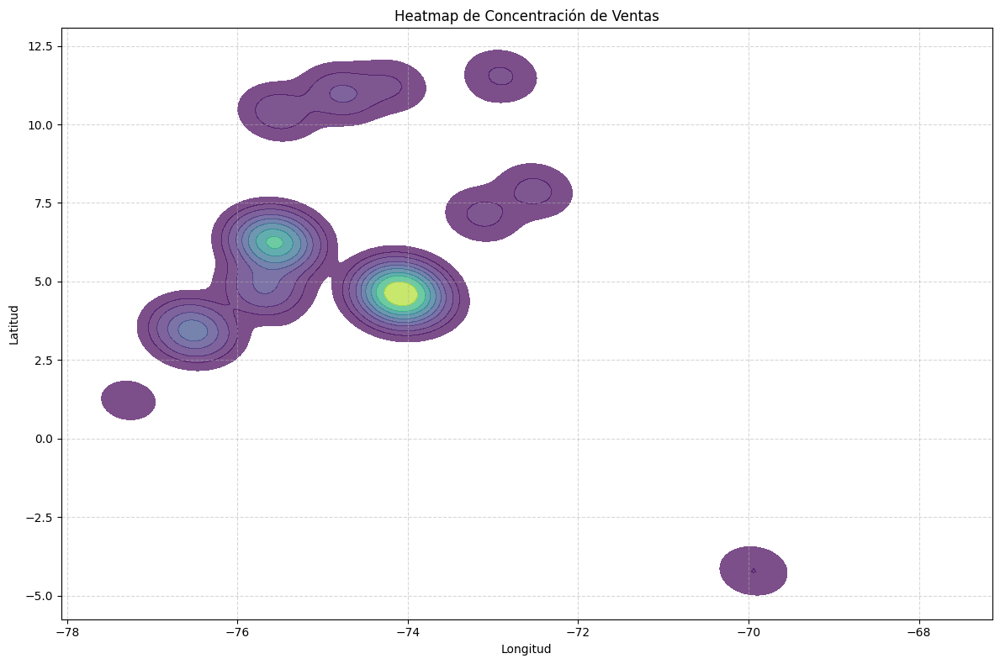

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.kdeplot(
    x='lon',
    y='lat',
    data=df_geografico,
    fill=True,
    cmap='viridis',
    alpha=0.7,
    levels=10 # Adjust number of contour levels for better visualization
)
plt.title('Heatmap de Concentración de Ventas')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

**MAPA INTERACTIVO USANDO LA LIBRERÍA FOLIUM**

In [40]:
import folium
from folium.plugins import MarkerCluster

# Center the map on Colombia (approximate coordinates for the center of the country)
map_colombia = folium.Map(location=[4.5709, -74.2973], zoom_start=6)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(map_colombia)

# Add markers for each transaction
for index, row in df_geografico.iterrows():
    # Ensure 'lat' and 'lon' are valid numbers
    if pd.notna(row['lat']) and pd.notna(row['lon']):
        popup_html = f"""
            <b>Tienda:</b> {row['Tienda']}<br>
            <b>Producto:</b> {row['Producto']}<br>
            <b>Precio:</b> ${row['Precio']:,.0f}<br>
            <b>Calificación:</b> {row['Calificación']}
        """
        folium.Marker(
            location=[row['lat'], row['lon']],
            popup=folium.Popup(popup_html, max_width=300),
            tooltip=f"{row['Tienda']} - {row['Producto']}"
        ).add_to(marker_cluster)

# Display the map
map_colombia